# Capítulo 1, LA MÚSICA EN LA CATEDRAL DE SANTO DOMINGO.
- En este cuaderno vamos a hacer un recorrido a través de las páginas del capítulo 1. Definiremos funciones para detectar palabras en el texto y para detectar los pentagramas

## Librerías necesarias

In [3]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 14 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 1s (3,737 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [4]:
!sudo apt-get install tesseract-ocr-spa

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-spa
0 upgraded, 1 newly installed, 0 to remove and 14 not upgraded.
Need to get 951 kB of archives.
After this operation, 2,309 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-spa all 4.00~git24-0e00fe6-1.2 [951 kB]
Fetched 951 kB in 1s (1,019 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tesseract-ocr-spa.
(Reading databa

In [5]:
pip install pytesseract

  Created wheel for pytesseract: filename=pytesseract-0.3.6-py2.py3-none-any.whl size=13629 sha256=e64940ab6b15c63f4ab836316a5a1eed65d6fe4759244780d956afc4b0600744
  Stored in directory: /root/.cache/pip/wheels/ee/71/72/b98430261d849ae631e283dfc7ccb456a3fb2ed2205714b63f
Successfully built pytesseract


In [6]:
pip install tesseract

     |████████████████████████████████| 45.6MB 91kB/s 
  Created wheel for tesseract: filename=tesseract-0.1.3-cp36-none-any.whl size=45562572 sha256=90e890eb3fcead338c6ea53978580070efbddd97b0ad44ab54bcf954b864070b
  Stored in directory: /root/.cache/pip/wheels/82/1f/d9/24797b123379e4ea9511cf660835468b62dad609634cad2aba
Successfully built tesseract


In [7]:
import cv2
import sys
import pytesseract
from pytesseract import Output
import argparse
import pickle
import re,string
import numpy as np
from unicodedata import normalize
from matplotlib import pyplot as plt

In [8]:
!unzip Fotos.zip

Archive:  Fotos.zip
  inflating: Fotos/pag1.jpg          
  inflating: Fotos/pag10.jpg         
  inflating: Fotos/pag11.jpg         
  inflating: Fotos/pag12.jpg         
  inflating: Fotos/pag13.jpg         
  inflating: Fotos/pag14.jpg         
  inflating: Fotos/pag15.jpg         
  inflating: Fotos/pag16.jpg         
  inflating: Fotos/pag17.jpg         
  inflating: Fotos/pag18.jpg         
  inflating: Fotos/pag19.jpg         
  inflating: Fotos/pag2.jpg          
  inflating: Fotos/pag20.jpg         
  inflating: Fotos/pag21.jpg         
  inflating: Fotos/pag22.jpg         
  inflating: Fotos/pag23.jpg         
  inflating: Fotos/pag3.jpg          
  inflating: Fotos/pag4.jpg          
  inflating: Fotos/pag5.jpg          
  inflating: Fotos/pag6.jpg          
  inflating: Fotos/pag7.jpg          
  inflating: Fotos/pag8.jpg          
  inflating: Fotos/pag9.jpg          


## Mostrando las fotos del capítulo 1

In [11]:
path = '/content/Fotos/'

In [ ]:
Fotos = []
for i in range(0,23):
  pag = cv2.imread(path + 'pag' + str(i+1) + '.jpg')
  pag = cv2.cvtColor(pag, cv2.COLOR_BGR2RGB)
  Fotos.append(pag)

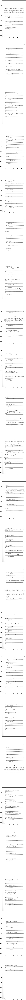

In [ ]:
fig, ax = plt.subplots(23,1,figsize=(16*23,16*23))
for i in range(0,23):
  ax[i].imshow(Fotos[i])
plt.show()

## Detectando los pentagramas

- **Función para detectar los pentagramas**

In [ ]:
def pentagramas(foto): 
  foto2 = foto.copy()
  (H,W) = foto.shape[:2]
  gray = cv2.cvtColor(foto,cv2.COLOR_RGB2GRAY)
  (T,threshInv) = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
  tthreshInv = cv2.resize(threshInv,(int(W*25/100),int(H*25/100)))
  dilate = cv2.dilate(threshInv.copy(),(15,1))
  
  for i in range(0,4):
    dilate = cv2.dilate(dilate,(15,1))

  cnts,_ = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  for c in cnts:
    area = cv2.contourArea(c)
    if(area > 10000):
      #cv2.drawContours(foto2, [c], -1, (119, 90, 17), 2)
      (x, y, w, h) = cv2.boundingRect(c) # Mejor sacar el rectángulo contenido
      cv2.rectangle(foto2, (x, y), (x + w, y + h), (119, 90, 17), 2)
  return foto2

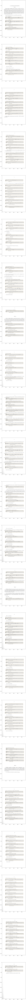

In [ ]:
contornos = [pentagramas(Fotos[i]) for i in range(0,23)]
fig, ax = plt.subplots(23,1,figsize=(16*23,16*23))
for i in range(0,23):
  ax[i].imshow(contornos[i])
plt.show()

## Detectando el texto

- **Función para borrar los pentagramas y que no molesten.**

In [ ]:
def pentagramaBlanco(foto):
  (H,W) = foto.shape[:2]
  gray = cv2.cvtColor(foto,cv2.COLOR_RGB2GRAY)
  (T,threshInv) = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
  tthreshInv = cv2.resize(threshInv,(int(W*25/100),int(H*25/100)))
  dilate = cv2.dilate(threshInv.copy(),(15,1))
  
  for i in range(0,4):
    dilate = cv2.dilate(dilate,(15,1))

  cnts,_ = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  for c in cnts:
    area = cv2.contourArea(c)
    if(area > 10000):
      cv2.drawContours(foto, [c], -1, (255, 255, 255), -1)
      (x, y, w, h) = cv2.boundingRect(c)
      cv2.rectangle(foto, (x, y+15), (x + w, y + h-15), (255, 255, 255), -1)
  return foto

- **Función para detectar el texto de una imagen**

In [ ]:
def espacios(str):
  n = len(str)
  return len([str[i] for i in range(0,n) if str[i]==' ']) == n

def sacarTexto(foto): # Esta función es importante ya que debemos ajustar las cosas bien para poder distinguir cada cosa correctamente.
  
  fotografia = foto.copy()
  foto2 = foto.copy()
  fotografia = pentagramaBlanco(fotografia)
  results = pytesseract.image_to_data(fotografia, lang='spa', output_type=Output.DICT)

  (H,W) = fotografia.shape[:2] # Alto y ancho de la imagen

  for i in range(0, len(results["text"])): # Vamos identificando todas las palabras

    # Sacamos las coordenadas de la palabra
	  x = results["left"][i]
	  y = results["top"][i]
	  w = results["width"][i]
	  h = results["height"][i]
	  # sacamos la palabra 
	  text = results["text"][i]
	  conf = int(results["conf"][i])


	  # Esto es para distinguir texto de otras cosas, si el área que ocupa ese objeto es pequeña entonces es una palabra.
	  if conf > 0.15 and 10 < h < 30 and 8 < w < 350 and not(espacios(text)):

		  text = "".join([c if ord(c) < 300 else "" for c in text]).strip()
		  cv2.rectangle(foto2, (x, y), (x + w, y + h), (0, 255, 0), 2) # Rodeamos la palabra
		  cv2.putText(foto2, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,0.4, (0, 0, 255), 3) # Ponemos arriba la palabra en formato texto.

  return foto2

In [ ]:
fotosConTexto = []
for i in range(0,23):
  fotosConTexto.append(sacarTexto(Fotos[i]))

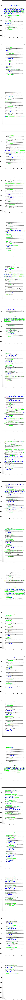

In [ ]:
fig, ax = plt.subplots(23,1,figsize=(16*23,16*23))
for i in range(0,23):
  ax[i].imshow(fotosConTexto[i])
plt.show()

## Guardando la información obtenida.

In [ ]:
texto = {}

In [2]:
def remove_punctuation(frase):
  char = re.sub('[%s]' % re.escape(string.punctuation.replace('-','')),'',frase)
  char = char.replace('¿','').replace('?','').replace('`','').replace('´','').replace('#','').lower()
  char = re.sub(
        r"([^n\u0300-\u036f]|n(?!\u0303(?![\u0300-\u036f])))[\u0300-\u036f]+", r"\1", 
        normalize( "NFD", char), 0, re.I
    )
  char = normalize( 'NFC', char)
  return char

In [ ]:
remove_punctuation('´{contrata-ción')

'contrata-cion'

In [ ]:
def guardarTexto(texto,foto,pag): # "texto" es un diccionario, le pasamos una "foto" para que almacene el texto de la página "pag"
  foto = pentagramaBlanco(foto)
  results = pytesseract.image_to_data(foto, lang='spa', output_type=Output.DICT)
  dic = {'text' : [], 'left' : [], 'top' : [], 'width' : [], 'height' : []}
  n = len(results['text'])
  for i in range(0,n):
    x = results['left'][i]
    y = results['top'][i]
    h = results['height'][i]
    w = results['width'][i]
    text = results['text'][i]
    conf = int(results['conf'][i])
    if conf > 0.15 and 10 < h < 30 and 8 < w < 350 and not(espacios(remove_punctuation(text))):
      dic['text'].append(remove_punctuation(text))
      dic['left'].append(x)
      dic['top'].append(y)
      dic['height'].append(h)
      dic['width'].append(w)
  texto[pag] = dic

In [ ]:
for i in range(0,23):
  guardarTexto(texto,Fotos[i],i+1)

In [ ]:
print(texto)

{1: {'text': ['1', 'cantorales', 'de', 'polifonia', 'num', '1', 'libro', 'de', 'misas', 'y', 'motetes', 'papel', 'manuscrito', 's', 'xviid', '214', 'folios', 'nu-', 'merados', 'por', 'nosotros', '371', 'x', '276', 'mm', 'la', 'caja', 'varia', 'como', 'tambien', 'el', 'numero', 'de', 'pentagramas', 'por', 'pagina', 'pues', 'el', 'volumen', 'consta', 'de', 'varias', 'secciones', 'escritas', 'por', 'diversos', 'copistas', 'tapas', 'de', 'madera', 'forradas', 'de', 'piel', 'con', 'guardas', 'de', 'metal', 'al', 'ser', 'encuadernado', 'se', 'cortaron', 'los', 'margenes', 'por', 'lo', 'que', 'todas', 'las', 'composiciones', 'que-', 'daron', 'anonimas', 'en', 'algunas', 'se', 've', 'parte', 'del', 'titulo', 'o', 'nombre', 'del', 'autor', 'sin', 'poder', 'leerse', 'este', 'ultimo', 'nunca', 'en', 'algunas', 'composiciones', 'el', 'corte', 'afecto', 'a', 'algunas', 'no-', 'tas', 'pero', 'ello', 'no', 'impide', 'el', 'leer', 'el', 'texto', 'musical', 'buen', 'estado', 'de', 'conservacion', 'exce

In [ ]:
print([cla for cla in texto])

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [ ]:
def guardarPentagramas(pentagramas,foto,pag): 
  (H,W) = foto.shape[:2]
  P = []
  gray = cv2.cvtColor(foto,cv2.COLOR_RGB2GRAY)
  (T,threshInv) = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
  tthreshInv = cv2.resize(threshInv,(int(W*25/100),int(H*25/100)))
  dilate = cv2.dilate(threshInv.copy(),(15,1))
  
  for i in range(0,4):
    dilate = cv2.dilate(dilate,(15,1))

  cnts,_ = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  for c in cnts:
    area = cv2.contourArea(c)
    if(area > 10000):
      P.append(cv2.boundingRect(c))
  pentagramas[pag] = P

In [ ]:
pentagramas = {}

In [ ]:
for i in range(0,23):
  guardarPentagramas(pentagramas,Fotos[i],i+1)

In [ ]:
print(pentagramas)

{1: [(169, 1373, 890, 75), (171, 1192, 890, 81), (172, 1008, 890, 82), (177, 827, 890, 86)], 2: [(181, 1432, 891, 76), (184, 1298, 889, 71), (178, 928, 892, 86), (177, 780, 891, 82), (178, 637, 891, 81), (185, 499, 891, 81), (186, 360, 890, 81), (190, 169, 888, 88)], 3: [(172, 1242, 889, 81), (169, 1110, 888, 75), (172, 966, 892, 81), (172, 829, 888, 81), (172, 684, 890, 81), (172, 495, 892, 74), (169, 359, 893, 74), (171, 215, 893, 81)], 4: [(194, 1493, 891, 77), (197, 1360, 889, 74), (198, 1218, 889, 74), (201, 1076, 890, 74), (210, 779, 887, 72), (200, 632, 893, 75), (202, 488, 875, 75), (202, 351, 892, 69), (203, 212, 890, 70)], 5: [(171, 1530, 890, 66), (173, 1360, 890, 72), (177, 1212, 890, 80), (179, 1024, 888, 81), (181, 884, 888, 81), (177, 746, 890, 81), (175, 599, 890, 82), (178, 459, 890, 81), (177, 212, 886, 77)], 6: [(195, 1491, 889, 71), (192, 1131, 887, 82), (196, 955, 884, 81), (196, 778, 884, 81), (203, 427, 889, 69), (205, 277, 889, 75), (207, 137, 888, 69)], 7: [(17

In [ ]:
print([cla for cla in pentagramas])

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [ ]:
with open("texto.pickle", "wb") as f:
    pickle.dump(texto, f)

In [ ]:
with open("pentagramas.pickle", "wb") as f:
    pickle.dump(pentagramas, f)

## Definiendo aplicaciones de búsqueda de palabras y de mostrar pentagramas

### Empezamos por lo fácil, mostrar los pentagramas

In [ ]:
with open("pentagramas.pickle", "rb") as f:
    pentagramas = pickle.load(f)

In [ ]:
def mostrarPentagramas():
  a = int(input('Indica la página que quieres ver.'))
  foto = cv2.imread(path + 'pag' + str(a) + '.jpg') # Vamos abriendo las fotos página a página
  foto = cv2.cvtColor(foto, cv2.COLOR_BGR2RGB)
  for p in pentagramas[a]:
    (x,y,w,h) = p
    cv2.rectangle(foto, (x, y), (x + w, y + h), (119, 90, 17), 2)
  fig, ax = plt.subplots(1,1,figsize=(16,16))
  ax.imshow(foto)
  plt.show()

Indica la página que quieres ver.5


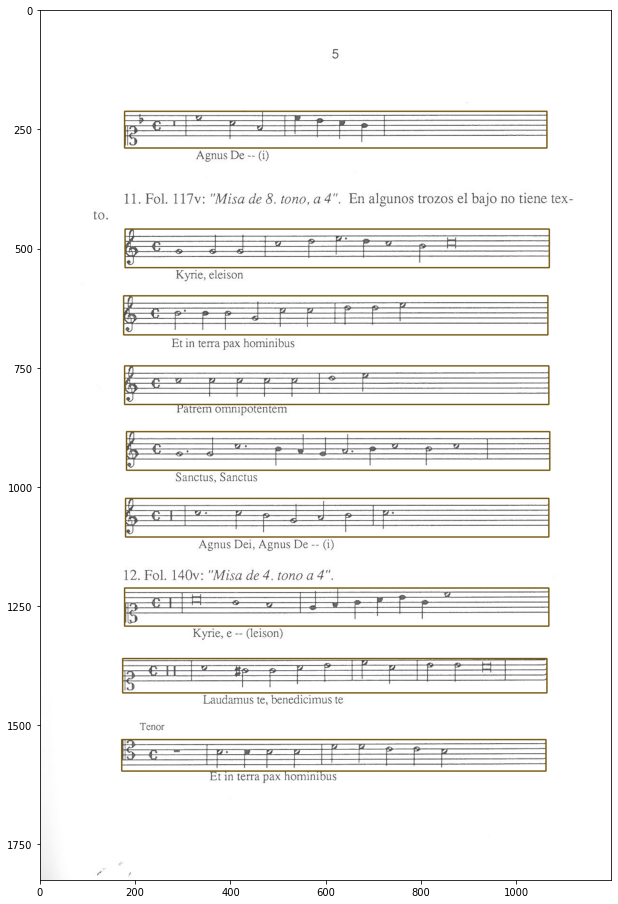

In [ ]:
mostrarPentagramas()

### Ahora búsqueda de texto

In [9]:
with open("texto.pickle", "rb") as f:
    texto = pickle.load(f)

In [10]:
print(texto)

{1: {'text': ['1', 'cantorales', 'de', 'polifonia', 'num', '1', 'libro', 'de', 'misas', 'y', 'motetes', 'papel', 'manuscrito', 's', 'xviid', '214', 'folios', 'nu-', 'merados', 'por', 'nosotros', '371', 'x', '276', 'mm', 'la', 'caja', 'varia', 'como', 'tambien', 'el', 'numero', 'de', 'pentagramas', 'por', 'pagina', 'pues', 'el', 'volumen', 'consta', 'de', 'varias', 'secciones', 'escritas', 'por', 'diversos', 'copistas', 'tapas', 'de', 'madera', 'forradas', 'de', 'piel', 'con', 'guardas', 'de', 'metal', 'al', 'ser', 'encuadernado', 'se', 'cortaron', 'los', 'margenes', 'por', 'lo', 'que', 'todas', 'las', 'composiciones', 'que-', 'daron', 'anonimas', 'en', 'algunas', 'se', 've', 'parte', 'del', 'titulo', 'o', 'nombre', 'del', 'autor', 'sin', 'poder', 'leerse', 'este', 'ultimo', 'nunca', 'en', 'algunas', 'composiciones', 'el', 'corte', 'afecto', 'a', 'algunas', 'no-', 'tas', 'pero', 'ello', 'no', 'impide', 'el', 'leer', 'el', 'texto', 'musical', 'buen', 'estado', 'de', 'conservacion', 'exce

In [ ]:
remove_punctuation('María')

'maria'

In [ ]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
remove_punctuation('´{contrata-ción hola')

'contrata-cion hola'

In [ ]:
'holacara' in 'holacaraculo'

True

In [ ]:
''.join(['hola','cara','culo'])

'holacaraculo'

In [ ]:
a  = ['hola','cara','culo-']
a[-1][-1] == '-'

True

In [37]:
L = [1,1,1,1]
L.unique()

AttributeError: ignored

In [40]:
def buscar(frase,texto): # Las fotos están en una carpeta. El texto es nuestro diccionario con la información.
  fotos = []
  path = '/content/Fotos/' # Las fotos están almacenadas en una carpeta, que más tarde será una base de datos.
  frase = frase.split()
  n = len(frase)
  frase = ''.join(frase)
  frase =  remove_punctuation(frase).replace(' ','')
  for cla in texto:
    foto = cv2.imread(path + 'pag' + str(cla) + '.jpg') # Vamos abriendo las fotos página a página
    foto = cv2.cvtColor(foto, cv2.COLOR_BGR2RGB)
    N = len(texto[cla]['text'])
    j = 0
    encontrado = False
    while j < N:
      k = j
      b = True
      siguiente = texto[cla]['text'][j:n+j]
      if siguiente[-1][-1] == '-':
        siguiente = ''.join(texto[cla]['text'][j:n+j+1])
        siguiente = siguiente.replace(' ','').replace('-','')
        j = j + 1
      else:
        siguiente = ''.join(siguiente)
        j = j + 1
        b = False

      if frase in siguiente:
        encontrado = True
        x = texto[cla]['left'][k]
        y = texto[cla]['top'][k]
        h = texto[cla]['height'][k]
        w = 0
        for i in range(k,k+n):
          w = w + texto[cla]['width'][i] + 7 # le añado un poco más para tener en cuenta la separación entre palabras 
        cv2.rectangle(foto,(x-10,y-10),(x+w+10,y+h+10),(226,182,19),2)
        if b:
          x = texto[cla]['left'][k+n]
          y = texto[cla]['top'][k+n]
          h = texto[cla]['height'][k+n]
          w = texto[cla]['width'][k+n]
          cv2.rectangle(foto,(x-10,y-10),(x+w+10,y+h+10),(226,182,19),2)
    if encontrado == True: fotos.append(foto)

  n = len(fotos)
  if n == 0:
    print('La palabra no aparece o está mal escrita.')
  else:
    print('APARECE EN ' + str(len(fotos)) + ' PÁGINAS.')
    fig, ax = plt.subplots(n,1,figsize=(16*n,16*n))
    for i in range(0,n):
      if n == 1:
        ax.imshow(fotos[i])
      else:
        ax[i].imshow(fotos[i])
    plt.show()

APARECE EN 1 PÁGINAS.


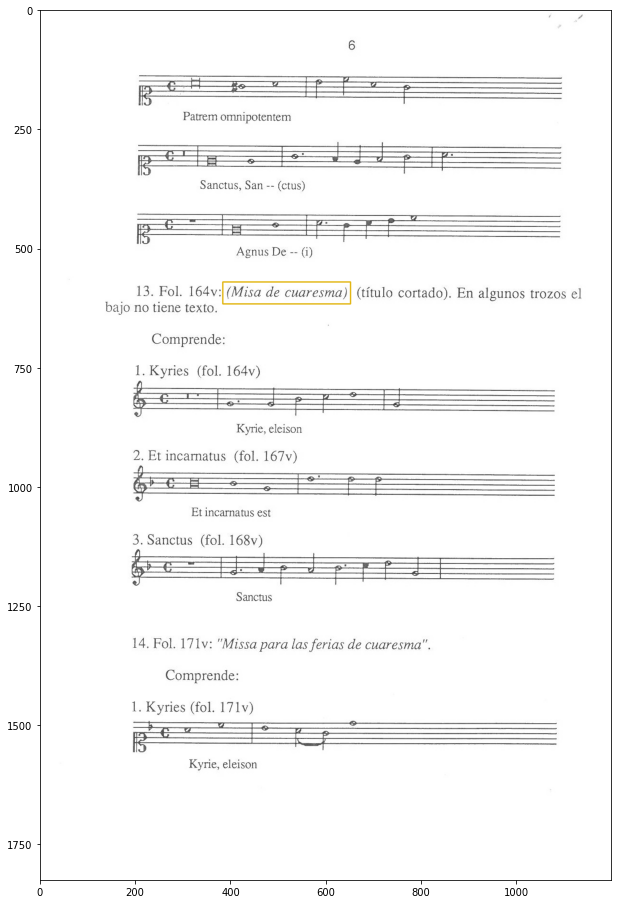

In [ ]:
buscar('misa de cuaresma',texto)

APARECE EN 2 PÁGINAS.


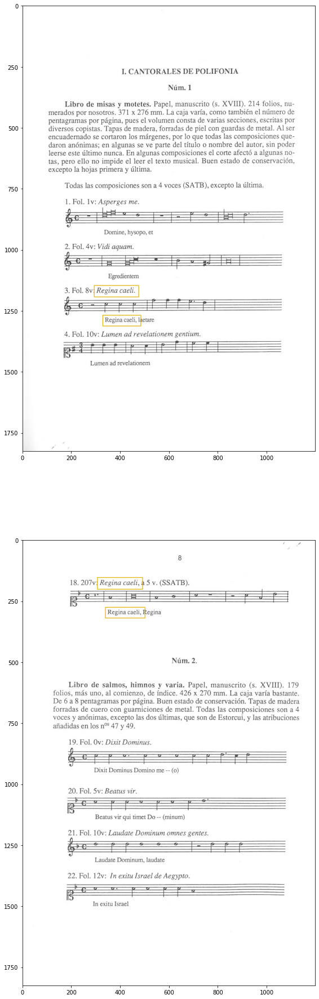

In [41]:
buscar('regina caeli',texto)

APARECE EN 2 PÁGINAS.


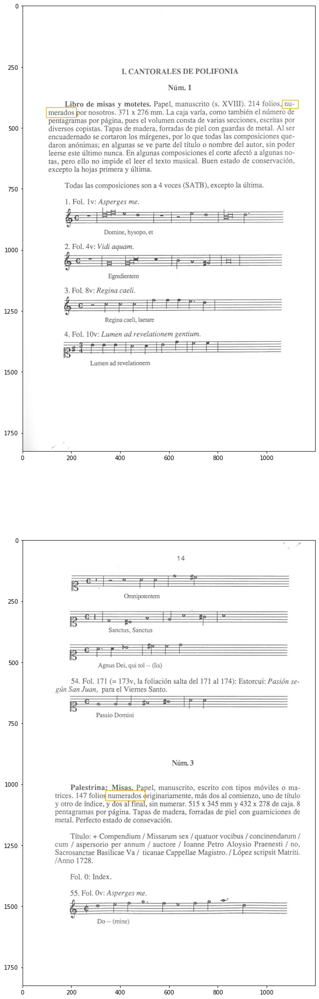

In [42]:
buscar('numerados',texto)

APARECE EN 13 PÁGINAS.


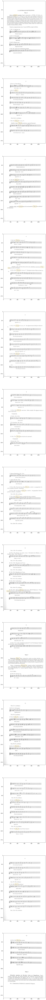

In [43]:
buscar('Mïs',texto)

APARECE EN 1 PÁGINAS.


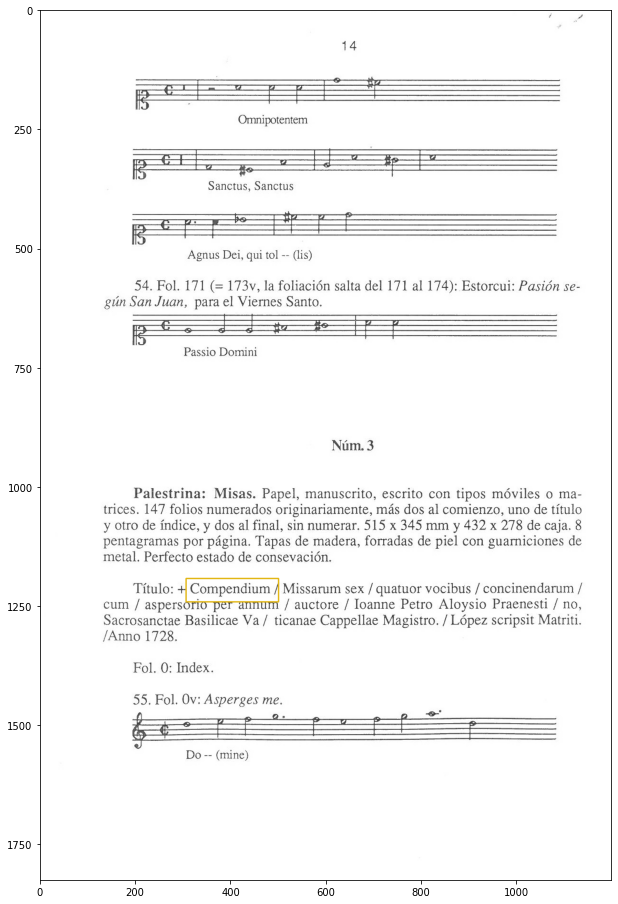

In [44]:
buscar('compendium',texto)